In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta, timezone
import glob
import os
from tqdm.notebook import tqdm
from Helpers import extract_metadata 

Helpers.py loaded successfully.


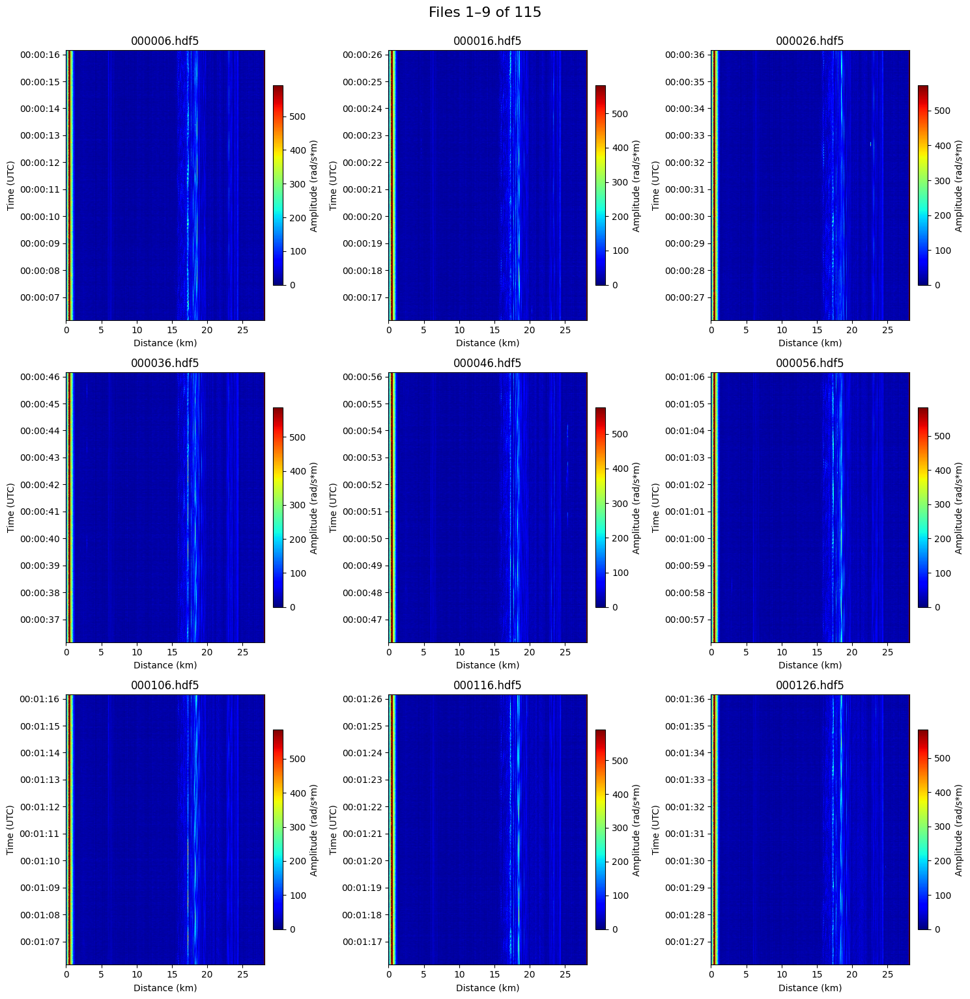

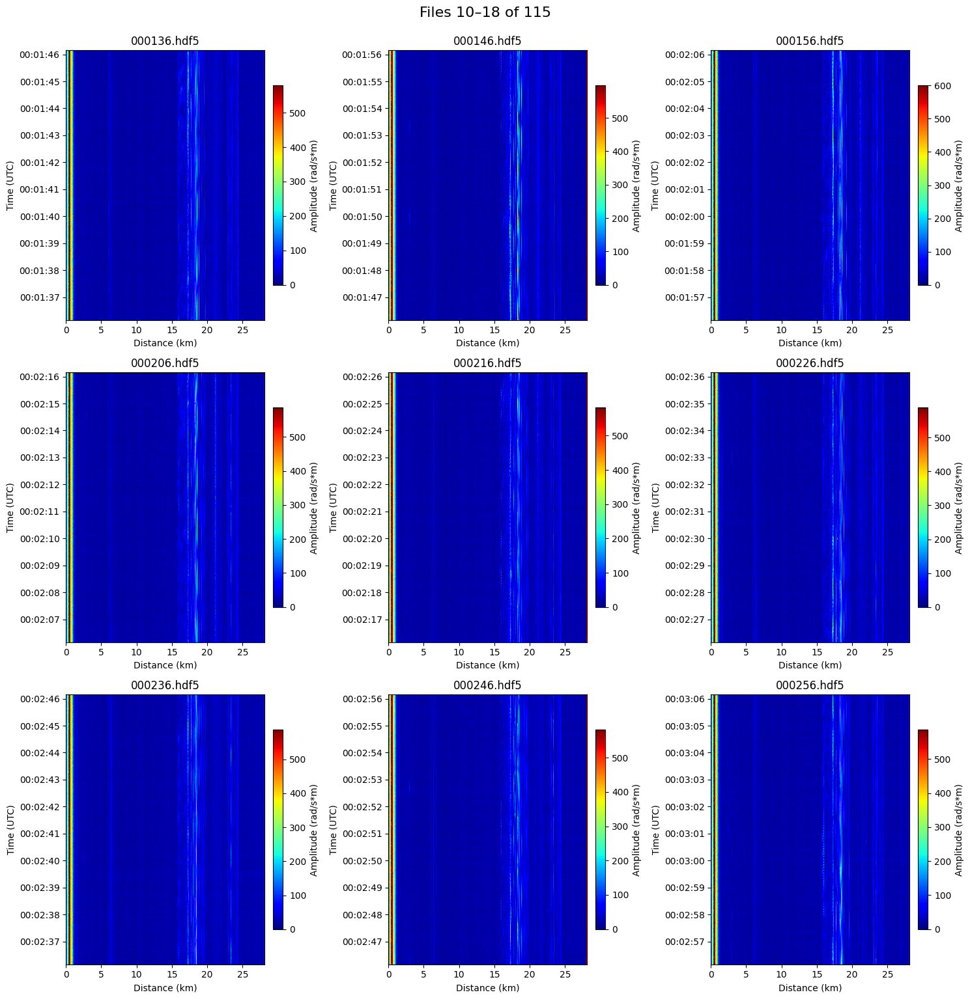

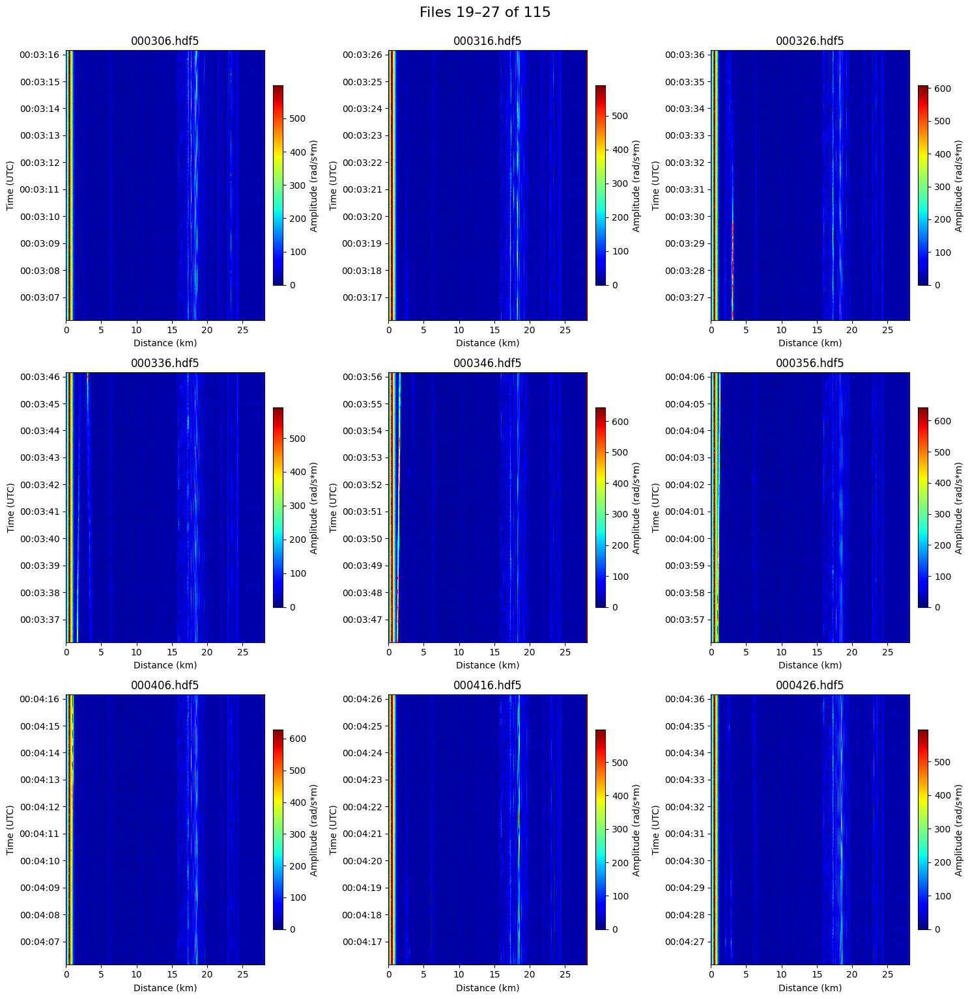

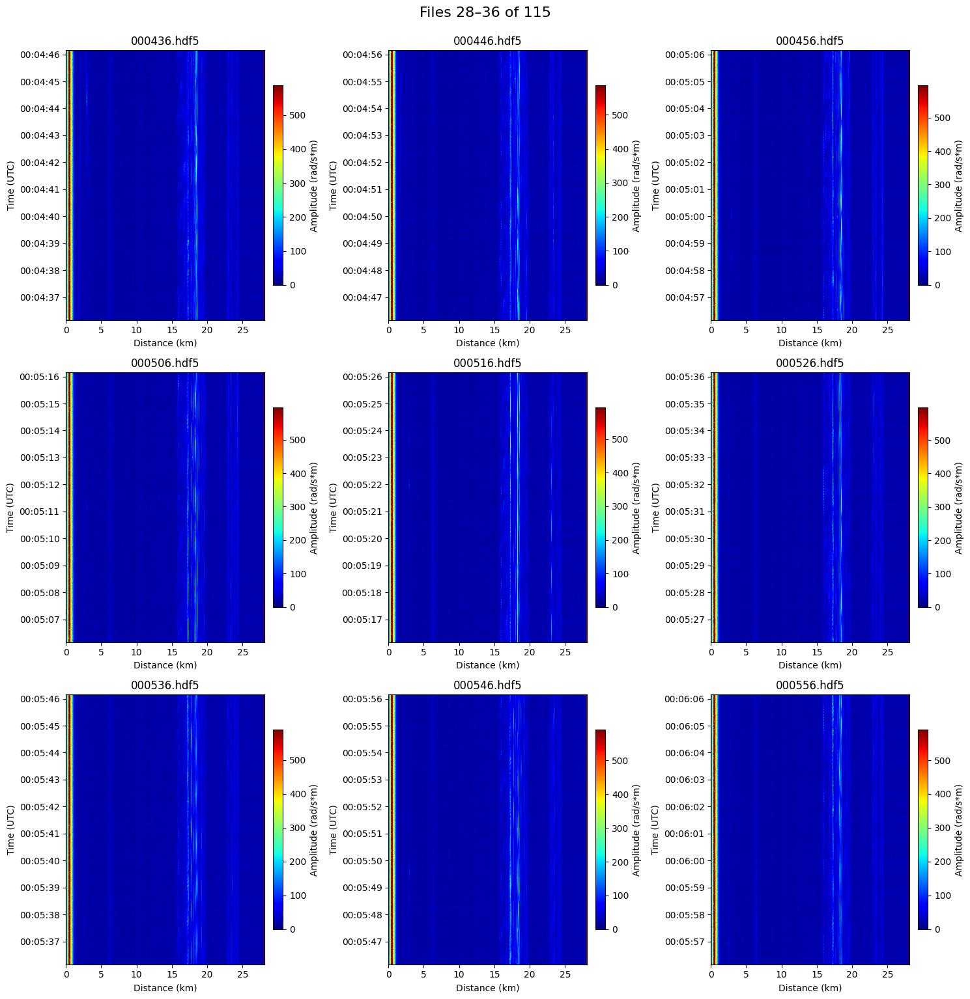

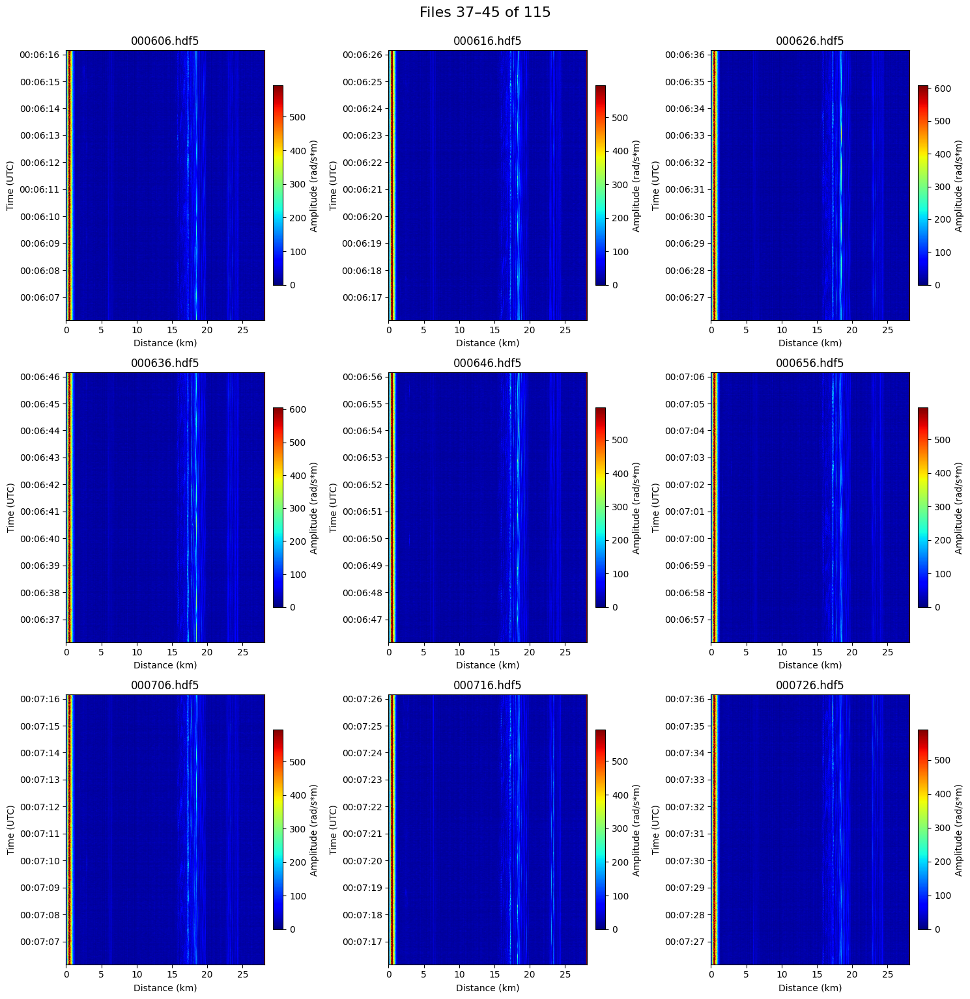

...

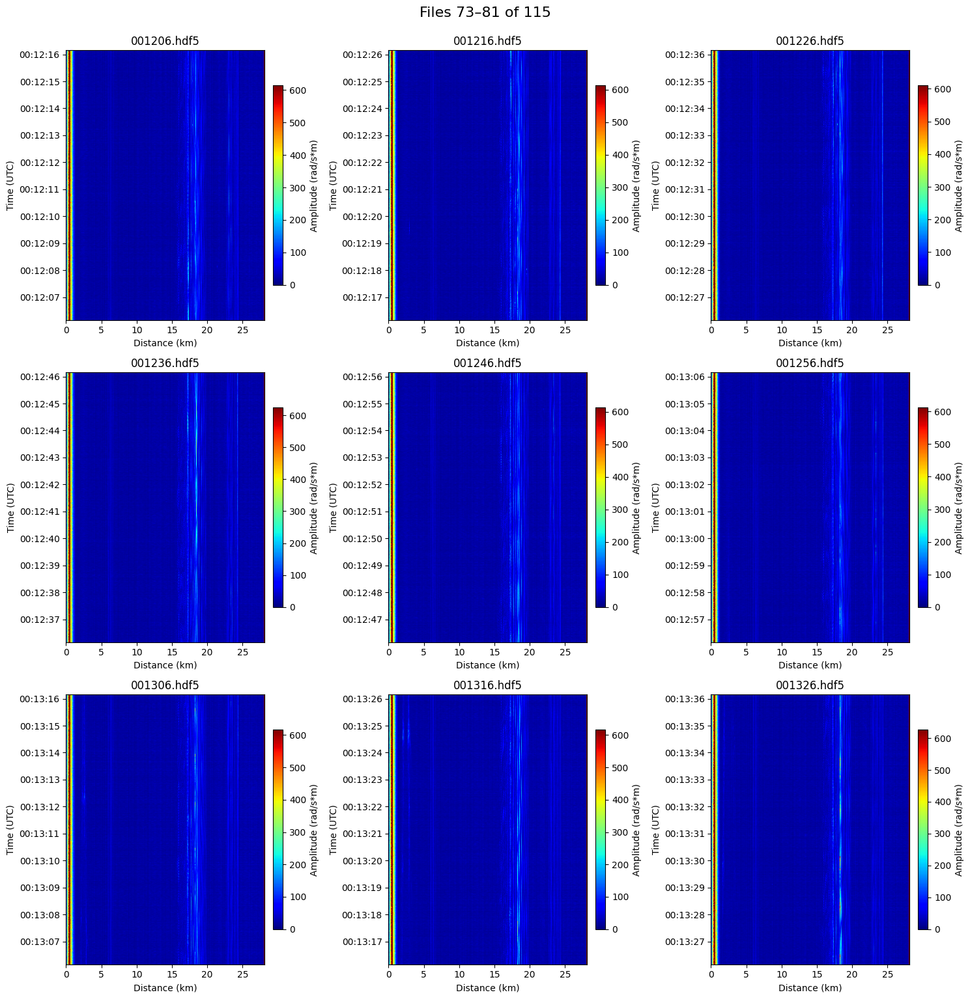

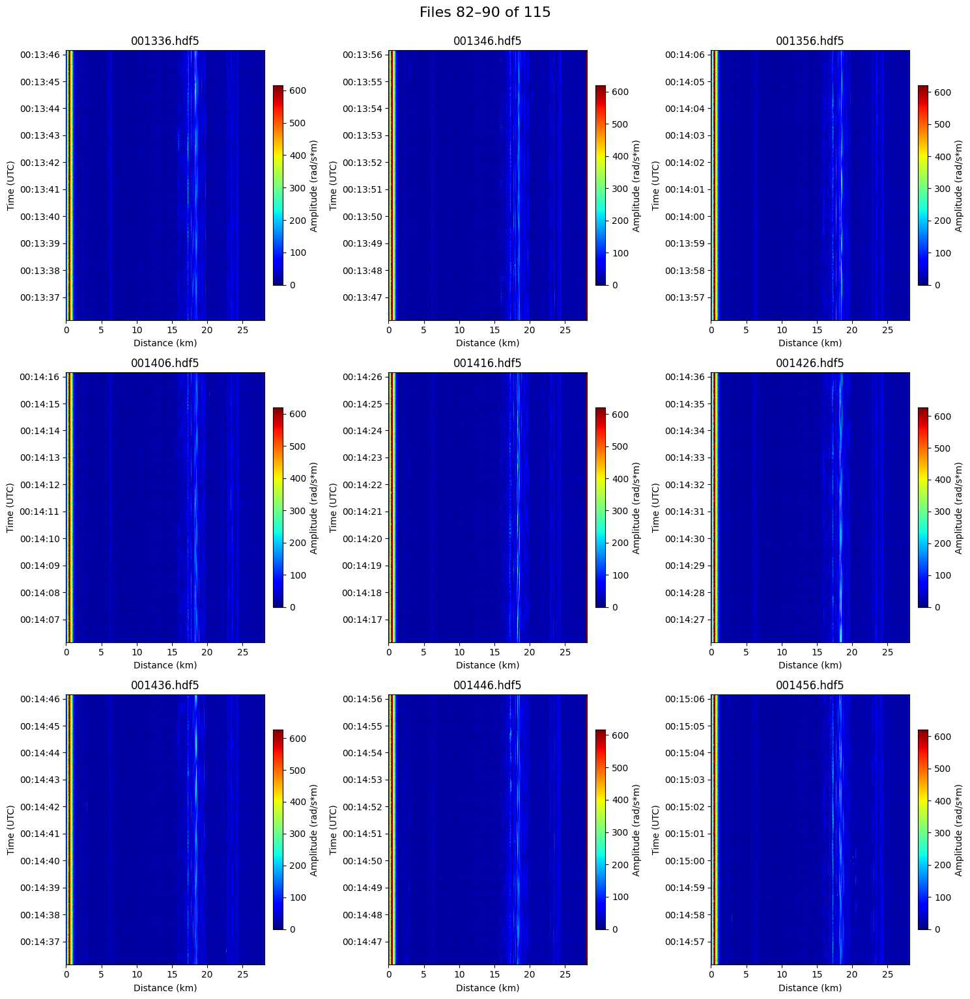

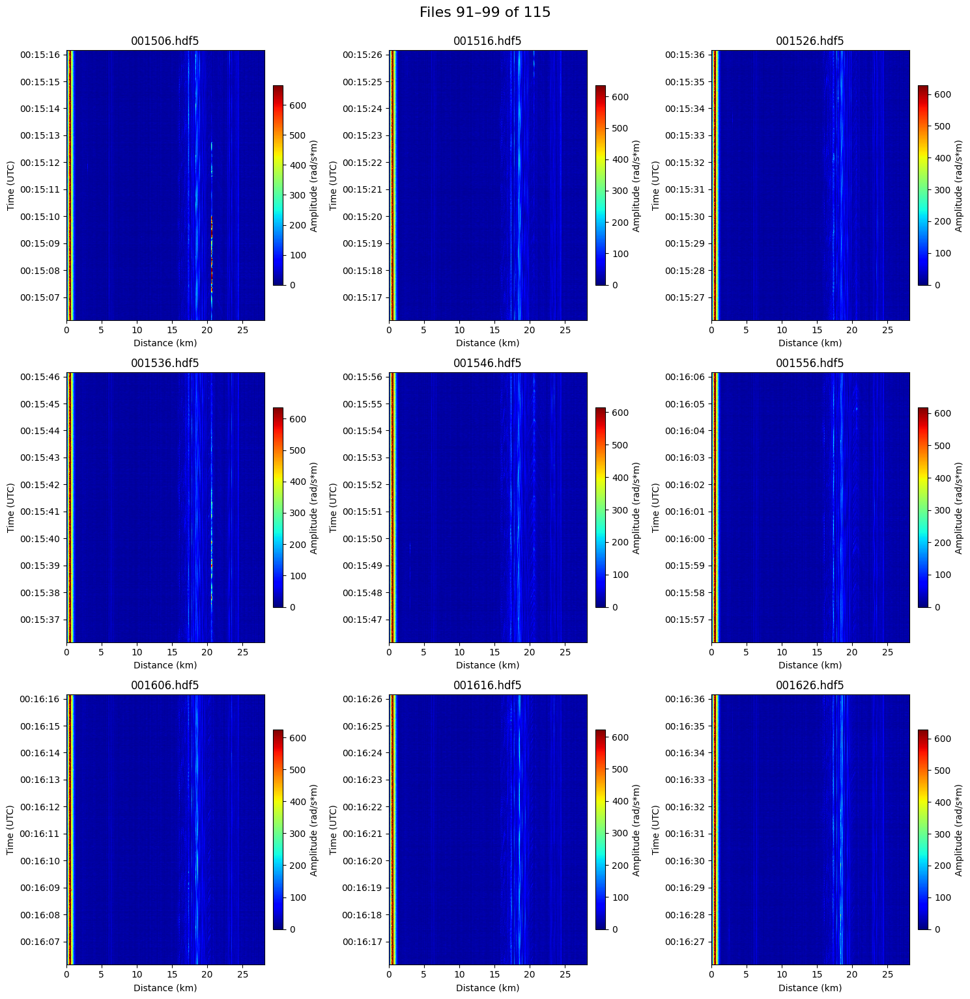

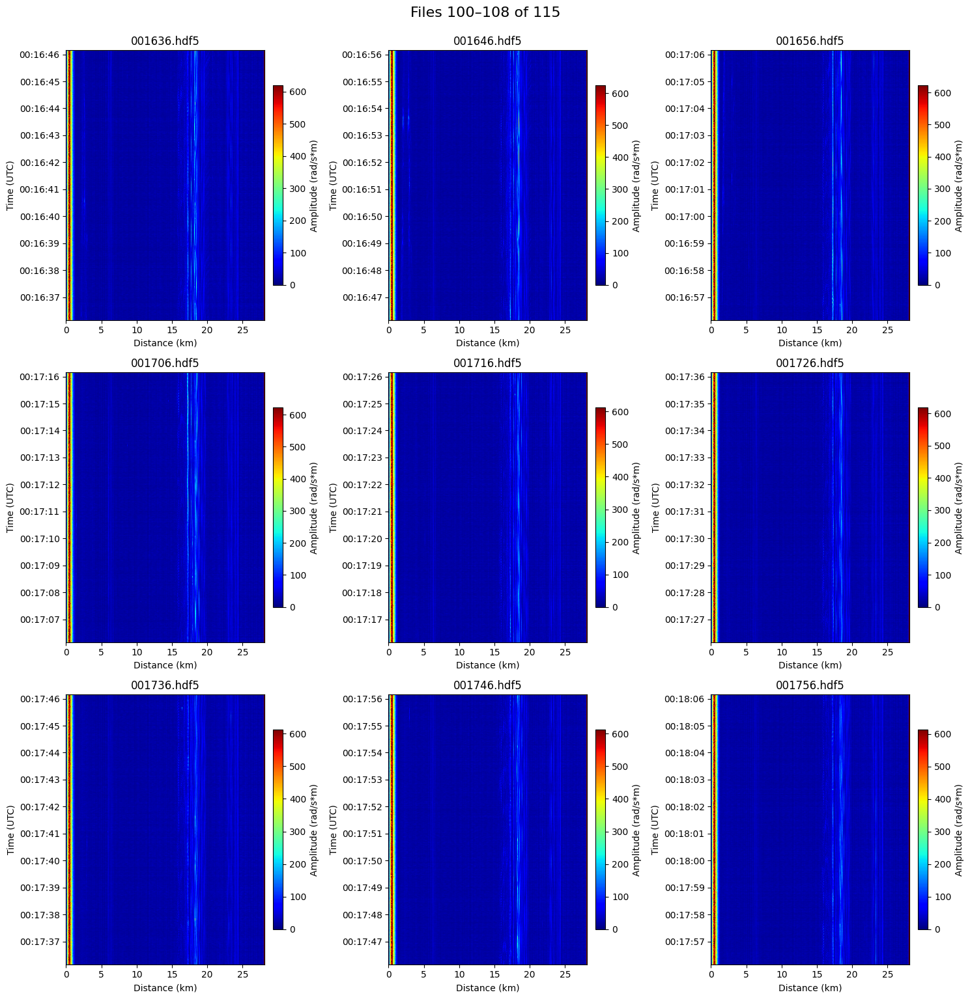

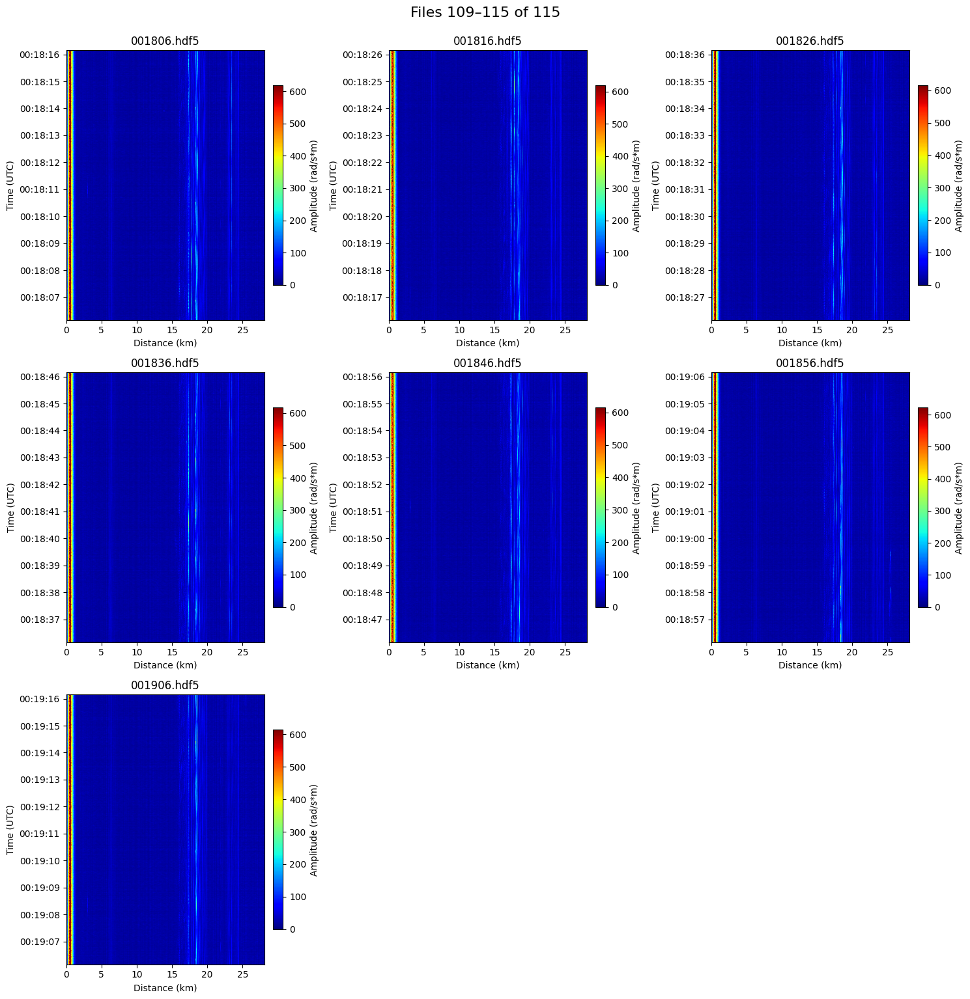

In [7]:
import math
from datetime import datetime, timedelta, timezone

import matplotlib.dates as mdates

# Redefine plotting function to accept full path
def plot_file_spectrogram(file_path, ax):
    """Loads, processes, and plots the full spectrogram for a single file.
       file_path must be a full path to the .hdf5 file."""
    if not os.path.exists(file_path):
        ax.set_title(f"File Not Found: {os.path.basename(file_path)}")
        ax.axis('off')
        return

    # 1. Load Data and Metadata
    start_time, dt, _, channels_raw, num_samples_raw = extract_metadata(file_path)
    with h5py.File(file_path, 'r') as f:
        data_raw = f['data'][:]

    # 2. Apply Masking/Downsampling (use notebook's CHANNEL_STEP and SAMPLE_STEP)
    distance_array_m = channels_raw * dx
    distance_array_km = distance_array_m / 1000.0
    dist_mask = (distance_array_km >= dmin_km) & (distance_array_km <= dmax_km)

    combined_data = data_raw[::SAMPLE_STEP, dist_mask][:, ::CHANNEL_STEP]
    distances = distance_array_km[dist_mask][::CHANNEL_STEP]

    # 3. Create Time Axis
    file_start_datetime = datetime.fromtimestamp(start_time, tz=timezone.utc)
    num_samples = combined_data.shape[0]
    time_deltas = np.arange(0, num_samples) * (dt * SAMPLE_STEP)
    time_axis = [file_start_datetime + timedelta(seconds=float(t)) for t in time_deltas]

    # 4. Vmax for plotting
    vmax_amp = np.percentile(np.abs(combined_data), 99)

    # 5. Plot
    img = ax.imshow(np.abs(combined_data),
                    aspect='auto',
                    extent=[distances[0], distances[-1],
                            mdates.date2num(time_axis[0]),
                            mdates.date2num(time_axis[-1])],
                    cmap='jet',
                    vmin=0,
                    vmax=vmax_amp)

    ax.yaxis_date()
    ax.yaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_title(os.path.basename(file_path))
    ax.set_ylabel('Time (UTC)')
    ax.set_xlabel('Distance (km)')

    # per-subplot colorbar (optional); comment out if too cluttered
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label='Amplitude (rad/s*m)')

# Batch plot all files into 3x3 grids
files = anomalous_files  # already absolute paths in notebook state
n_files = len(files)
group_size = 9  # 3x3
n_figs = math.ceil(n_files / group_size)

for fig_idx in range(n_figs):
    start = fig_idx * group_size
    end = min(start + group_size, n_files)
    chunk = files[start:end]

    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    axs = axs.flatten()

    for i in range(group_size):
        ax = axs[i]
        if i < len(chunk):
            plot_file_spectrogram(chunk[i], ax)
        else:
            ax.axis('off')  # empty slot

    plt.tight_layout()
    plt.suptitle(f'Files {start+1}–{end} of {n_files}', y=1.02, fontsize=16)
    plt.show()


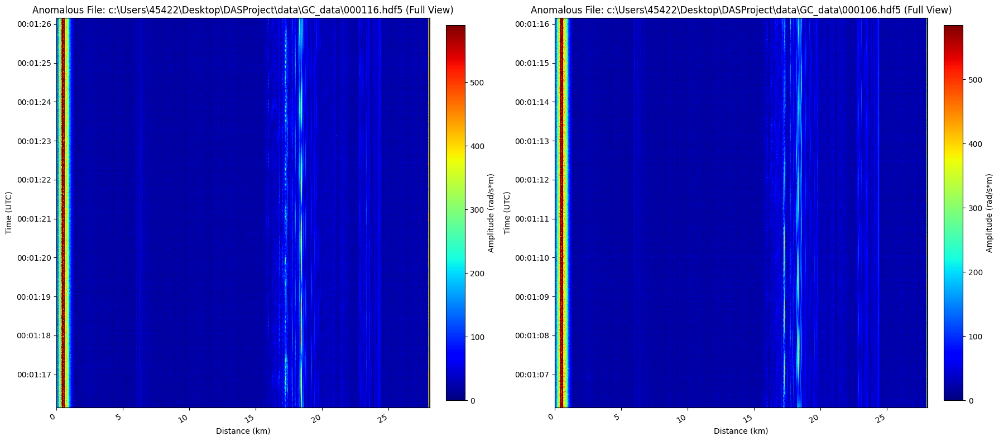

In [4]:
# Define the directory and relevant file names
directory = "data/GC_data"
random_samples = ['000116.hdf5', '000106.hdf5']  # The two most anomalous files

# Build absolute paths so extract_metadata always receives a full path
random_files = [os.path.abspath(os.path.join(directory, bn)) for bn in random_samples]

# Quick existence check
for p in random_files:
    if not os.path.exists(p):
        print(f"Warning: file not found: {p}")

# --- Configuration matching Step 1 ---
# These must match the preprocessing used for the model input
dmin_km = 0
dmax_km = 30 
CHANNEL_STEP = 2        # Sampling every second channel
SAMPLE_STEP = 1         # Temporal downsampling factor (no temporal downsampling applied)
dmin_km, dmax_km = 0, 30 
# Ensure we call extract_metadata with a full path and get dx (meters per channel)
first_path = random_files[0]
dx = extract_metadata(first_path)[2]  # Get actual dx

# --- Main Plotting Execution ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
plt.subplots_adjust(wspace=0.3)

# Plot File 1
plot_file_spectrogram(random_files[0], axes[0])

# Plot File 2
plot_file_spectrogram(random_files[1], axes[1])

plt.tight_layout()
plt.show() #
